# Energy Systems Modeling for France - Land Eligibility and Weather Data Analysis

##### Importing data analysis libraries

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl

##### Importing Geo Analysis libraries

In [2]:
import atlite
import rasterio as rio
import cartopy.crs as ccrs
from rasterio.plot import show
from atlite.gis import ExclusionContainer
from atlite.gis import shape_availability

##### Importing Additional libraries

In [3]:
plt.style.use('bmh')
import warnings
warnings.filterwarnings("ignore")
import copy
import plotly.express as px
import plotly.offline as py
import xarray as xr
from pathlib import Path

## Importing Land Area

In [4]:
# Getting land area of France and plot
fn = "../data/gadm_410-levels-ADM_1-FRA.gpkg"
france_gdf = gpd.read_file(fn)

## Importing EEZ Data for Ocean Areas

In [6]:
# Importing EEZ Data for Ocean Areas
# Getting ocean territory area of France and plot
fm = "../data/eez_v11.gpkg"
ocean = gpd.read_file(fm)
ocean_region_fra = ocean[ocean.GEONAME == "French Exclusive Economic Zone"]

## Merging Land areas and Creating Regions

In [7]:
# Merging Land areas and Creating Regions# Dissolve France map into five regions using dictionary mapping

france_gdf["regions"] = ['Central','Central','Western',
'Central','Island','Northern','Northern','Northern','Northern','Western','Southern','Western','Southern']
france_gdf = france_gdf.dissolve(by="regions")

# Abbrevating the region names

region_names = ['C','I','N','S','W'] 
france_gdf['Region_Abb'] = region_names
france_gdf.index = france_gdf.Region_Abb
provinces = france_gdf
france_gdf = france_gdf[['geometry']]

# Calculating the coordinates of center of each region
points = france_gdf.representative_point()

In [9]:
import folium

colors = ["green", "darkred", "magenta", "red", "blue"]

# Create the first map from gdf1
m = france_gdf.explore(color=colors)

# Add the second GeoDataFrame to the same map
ocean_region_fra.explore(m=m, color='yellow')

# Optional: Add layer control to toggle layers
folium.LayerControl().add_to(m)

# Display the map
m

#### Reproject geometries for area calculations:

In [10]:
# Only for area calculations
AREA_CRS = "ESRI:54009"

# Reprojecting France
france_1 = france_gdf.dissolve().to_crs(crs=3035)
france_2 = france_gdf.dissolve().to_crs(crs=AREA_CRS)
france = france_1.geometry.item()
france1 = france_2.geometry.item()

# Reprojecting land regions
land_shape = france_gdf.to_crs(crs=3035).geometry
land_shape1 = land_shape.to_crs(crs=AREA_CRS)

# Reprojecting French Exclusive Economic Zone
france_ocean = ocean[ocean.GEONAME == "French Exclusive Economic Zone"].to_crs(crs=3035)
france_ocean = france_ocean.geometry.item()
france_ocean1 = ocean[ocean.GEONAME == "French Exclusive Economic Zone"].to_crs(crs=AREA_CRS)
france_ocean1 = france_ocean1.geometry.item()


france_ocean_region = ocean_region_fra.to_crs(crs=4258)
france_ocean_shape = ocean_region_fra.to_crs(crs=3035).geometry
france_ocean_shape1 = france_ocean_shape.to_crs(crs=AREA_CRS)

## Land Eligibility Analysis

#### Exclude and include eligible inland territories for solar generation

In [11]:
#### Exclude and include eligible inland territories for onwind generation
#Exclude solar regions
solar_excluder=  ExclusionContainer ( crs = 3035,  res = 300 ) 

f = ('../data/PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326-FR.tif')
solar_excluder . add_raster ( f,  codes = [ 20 , 30 , 40 , 60,50 ],  crs = 4258 ,  invert = True ) 

f = ('../data/WDPA_Oct2022_Public_shp-FRA.tif') 
solar_excluder . add_raster ( f,  crs = 3035 )

#### Exclude and include eligible inland territories for onwind generation

In [13]:
#Exclude onwind regions
onwind_excluder= ExclusionContainer ( crs = 3035, res = 300 ) 

onwind_excluder . add_geometry ( "../data/ne_10m_roads.gpkg" , buffer = 300 ) # for major roads
onwind_excluder . add_geometry ( "../data/ne_10m_airports.gpkg" , buffer = 10000 ) #for major airports

fn = ('../data/PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326-FR.tif') #clc
onwind_excluder . add_raster ( fn , codes =[50 ], buffer = 1000 , crs = 4258 ) #built up area
onwind_excluder . add_raster ( fn , codes=lambda x: x>2000,  crs = 4258 ) #Exclude elevation over 2000m
onwind_excluder . add_raster ( fn , codes = [ 20 , 30 , 40 , 60 ], crs = 4258 , invert = True ) #including shrubs, and small vegetations

fn = ('../data/WDPA_Oct2022_Public_shp-FRA.tif') 
onwind_excluder . add_raster ( fn , crs = 3035 ) #excluding the natural protected areas

Exclusion Container
 registered rasters: 4 
 registered geometry collections: 2
 CRS: 3035 - Resolution: 300

#### Exclude and include eligible maritime territories for offwind generation

In [15]:
#Exclude offwind regions
offwind_excluder= ExclusionContainer ( crs = 3035, res = 300 ) 

offwind_excluder.add_raster ( '../data/GEBCO_2014_2D-FR.nc' , codes=lambda x: x<(-50), crs=4258) # Exclude depths over 50m                                             
offwind_excluder.add_geometry(france_1, buffer = 10000) # 10km min distance to shoreline

offwind_excluder.add_geometry('../data/eez_boundaries_v11.gpkg') # Within EEZ boundaries

fn = ('../data/WDPA_Oct2022_Public_shp-FRA.tif') 
offwind_excluder.add_raster ( fn , crs = 4258 ) #excluding the natural protected areas

#### Funtions for plotting and calculation

In [17]:
def  plot_area ( masked ,  transform ,  shape ): 
    fig ,  ax  =  plt . subplots ( figsize = ( 5 , 5 )) 
    ax  =  show ( masked ,  transform = transform ,  cmap = 'Greens' ,  vmin = 0 ,  ax = ax ) 
    shape . plot ( ax = ax , edgecolor = 'k' ,  color = 'None' ,  linewidth = 1 )

In [18]:
# Function to calculate Eligible Area
def elig_area(masked, excluder, region): # Function takes 3 inputs: Masked, Excluder, Region (Land/Ocean)
    eligible_cells = np.int64(masked.sum())
    cell_area = excluder.res**2
    eligible_area = cell_area * eligible_cells
    total_area = region.area
    percent_area = (eligible_area / total_area) * 100
    return percent_area, eligible_area

In [19]:
def area_calc(land_shape, excluder):
    area_percent = []
    available_area = []
    x = 0
    y = 1

    for i in land_shape.index:
        masked, transform = shape_availability(land_shape[x:y], excluder)
        arp, ar = elig_area(masked, excluder, land_shape[x:y])
        area_percent.append(arp.item())
        available_area.append(ar)
        x = x+1
        y = y+1

    available_area = [i / 1e6 for i in available_area]
    df = pd.DataFrame()
    df['Region_Abb'] = region_names[:len(available_area)]
    df['Area km2'] = available_area[:len(df)]
    df['Area_Percent'] = area_percent[:len(df)]
    df = df.set_index('Region_Abb')
    df['Cap per region'] = df['Area km2'] * 3 # MW/km2

    return df

#### Calculation and plotting of eligible areas

For Onshore, 102010.6 km2 is available, which is 18.56% of france Land


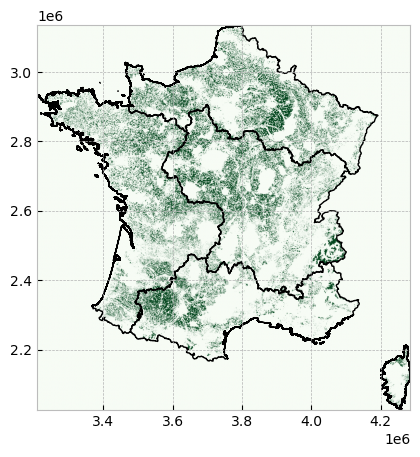

In [81]:
# Plotting onshore land eligibility
onshore_masked, onshore_transform = shape_availability(land_shape, onwind_excluder)

percent_area, eligible_area = elig_area(onshore_masked, onwind_excluder, france)

print(f'For Onshore, {eligible_area/1e6:0.1f} km2 is available, which is {percent_area:0.2f}% of france Land')
plot_area(onshore_masked, onshore_transform, land_shape)

For Offshore, 21750.3 km2 is available, which is 6.30% of France EEZ


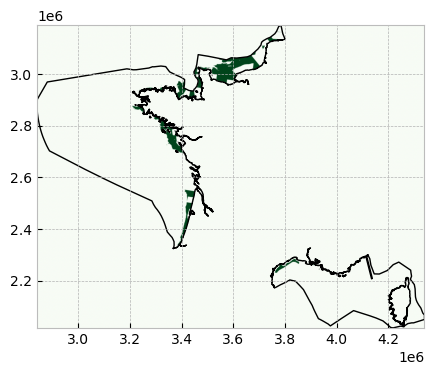

In [82]:
# Plotting offshore land eligibility
ocean_masked, ocean_transform = shape_availability(france_ocean_shape, offwind_excluder)

percent_area, eligible_area = elig_area(ocean_masked, offwind_excluder, france_ocean)
print(f'For Offshore, {eligible_area/1e6:0.1f} km2 is available, which is {percent_area.item():0.2f}% of France EEZ')

plot_area(ocean_masked, ocean_transform, france_ocean_shape)

For Solar, 245174.6 km2 is available, which is 44.62% of france Land


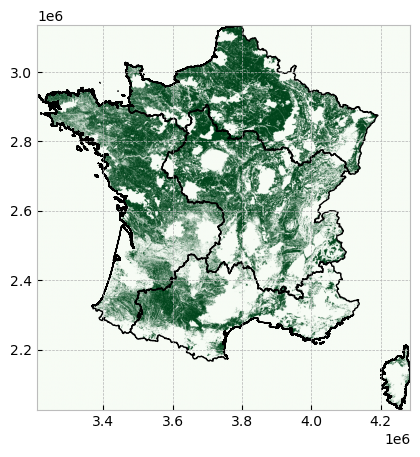

In [83]:
# Plotting solar land eligibility
solar_masked, solar_transform = shape_availability(land_shape, solar_excluder)

percent_area, eligible_area = elig_area(solar_masked, solar_excluder, france)
print(f'For Solar, {eligible_area/1e6:0.1f} km2 is available, which is {percent_area:0.2f}% of france Land')

plot_area(solar_masked, solar_transform, land_shape)

## ERA5 weather data collection.

#### ERA5 inland weather data collection

#### ERA5 maritime weather data collection

#### Combining nc files

## Deployment and Renewable profiles creation.

In [ ]:
cutout = atlite.Cutout("france-2022-combined.nc")

In [95]:
ocean_cutout = atlite.Cutout("france_ocean-2022-combined.nc")

#### Off shore wind profiles

In [96]:
#create offshore wind profiles
offwind_A = ocean_cutout.availabilitymatrix(france_ocean_shape, offwind_excluder)
offwind_matrix = offwind_A.stack(spatial=("y", "x"))

offshore = ocean_cutout.wind(
    atlite.windturbines.NREL_ReferenceTurbine_5MW_offshore,
    matrix=offwind_matrix,
    index=france_ocean_region.index,
    per_unit=True,
)

offshore = offshore.to_pandas()

<Axes: xlabel='time'>

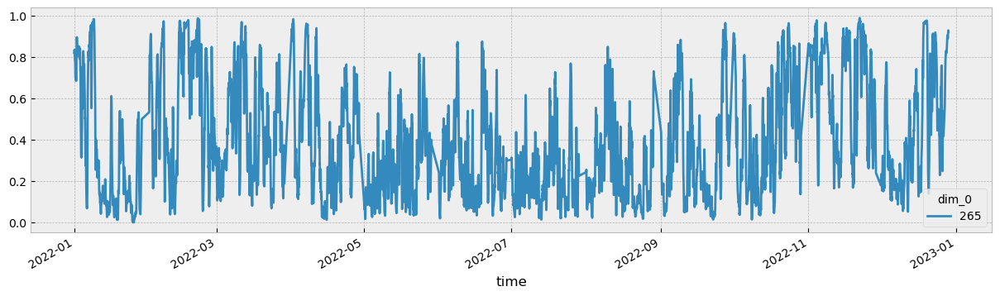

In [98]:
offshore.plot(figsize=(15,4))

#### On shore wind profiles

In [66]:
# Onshore wind profile
onwind_A = cutout.availabilitymatrix(land_shape, onwind_excluder)
onwind_matrix = onwind_A.stack(spatial=("y", "x"))

onwind = cutout.wind(
    atlite.windturbines.Vestas_V112_3MW,
    matrix=onwind_matrix,
    index=france_gdf.index,
    per_unit=True
)

onwind = onwind.to_pandas()

<Axes: xlabel='time'>

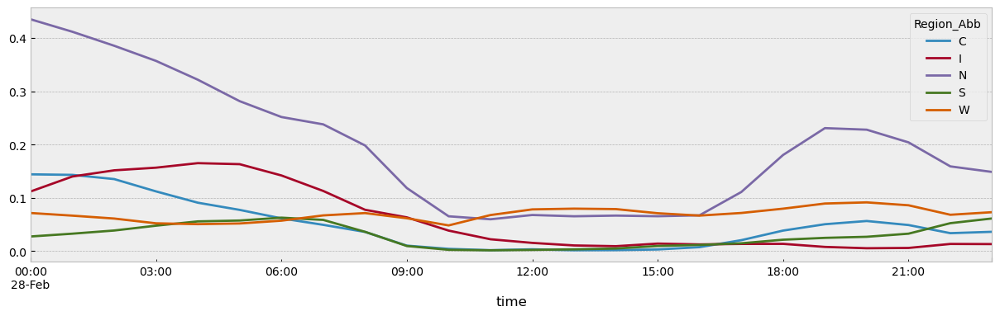

In [90]:
onwind.loc['2022-02-28 00:00:00':'2022-02-28 23:00:00'].plot(figsize=(15,4))

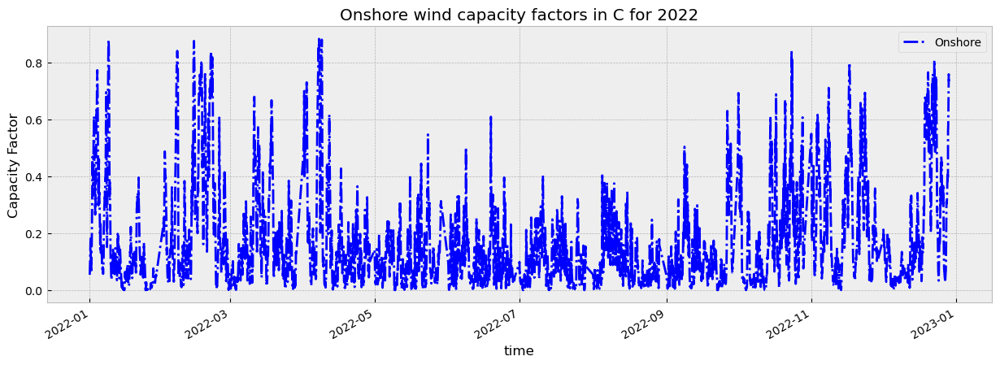

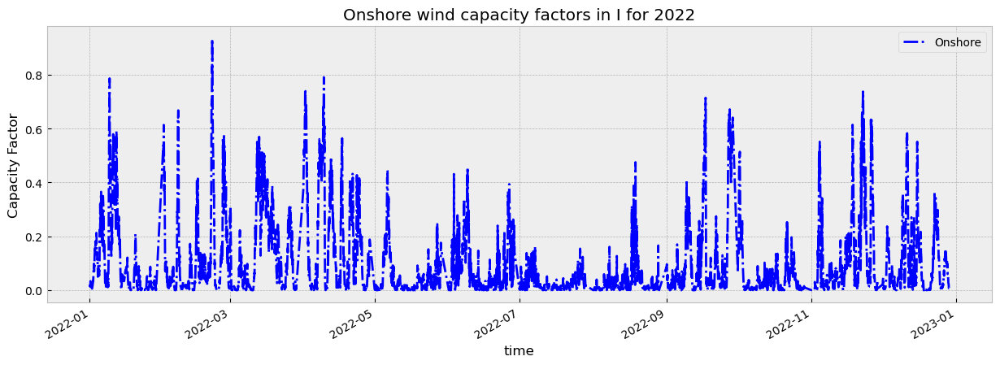

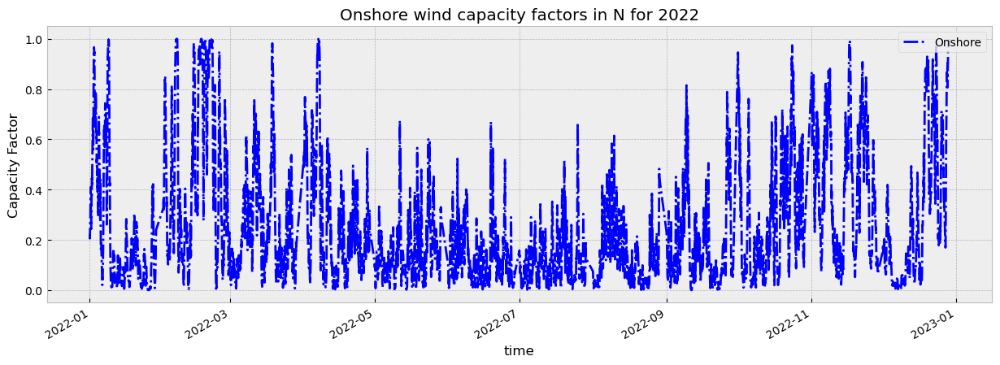

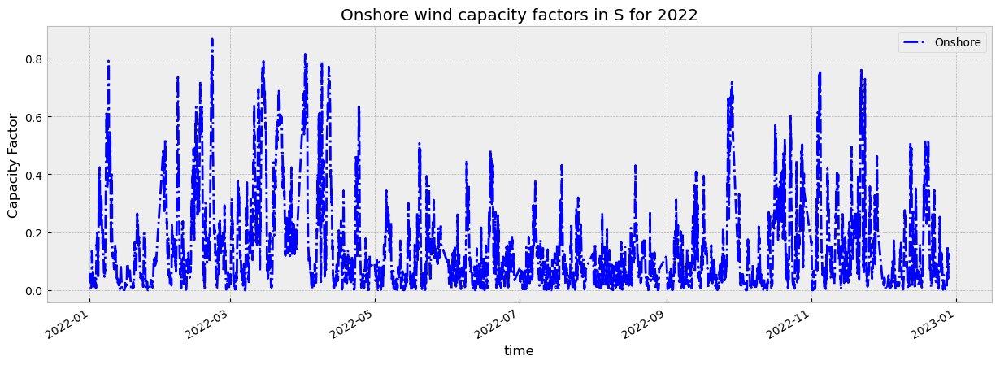

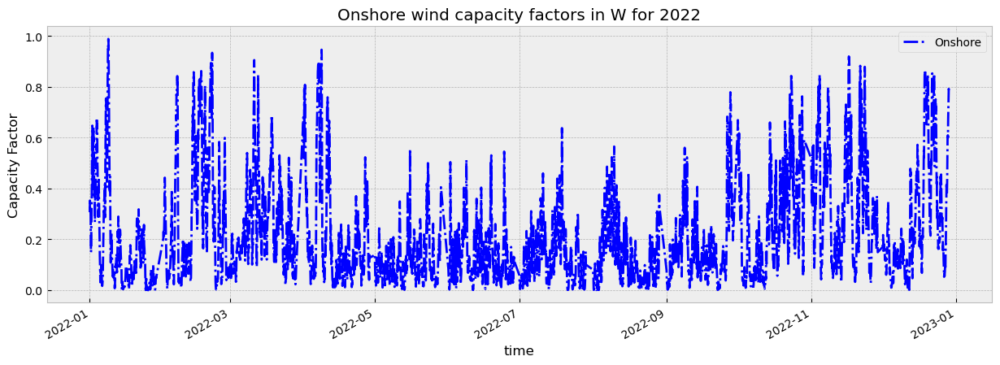

In [86]:
for region in region_names:
    us = pd.Series(onwind[region], index=onwind.index)

    fig, ax = plt.subplots(figsize=(15,5))
    plt.title(f'Onshore wind capacity factors in {region} for 2022')
    us.plot(color="blue", linestyle='-.', label='Onshore')
    plt.ylabel('Capacity Factor')
    plt.legend(loc="upper right")

#### Solar profiles

In [55]:
# Assume solar_A is a 2D DataArray (y, x) matching cutout's grid
solar_matrix = solar_A.stack(spatial=("y", "x"))

# Solar PV profile
pv = cutout.pv(
    panel=atlite.solarpanels.CdTe,
    matrix=solar_matrix,
    orientation='latitude_optimal',
    index=france_gdf.index,
    per_unit=True
)

pv = pv.to_pandas()

<Axes: xlabel='time'>

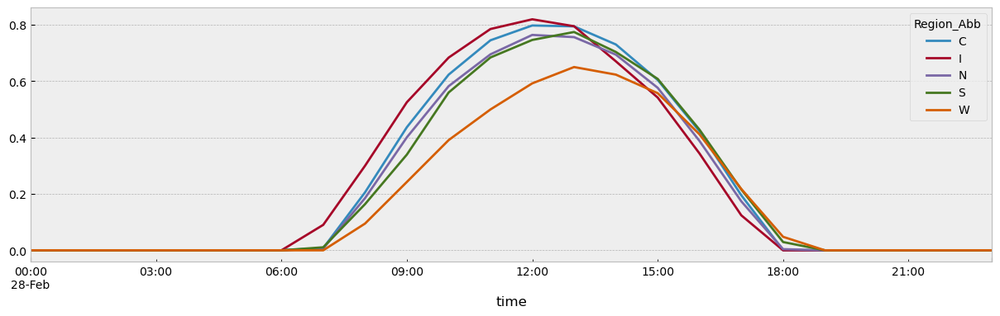

In [75]:
pv.loc['2022-02-28 00:00:00':'2022-02-28 23:00:00'].plot(figsize=(15,4))

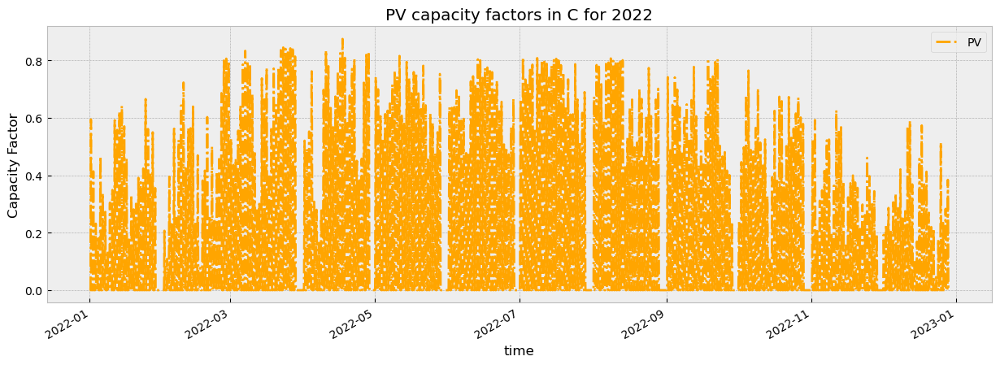

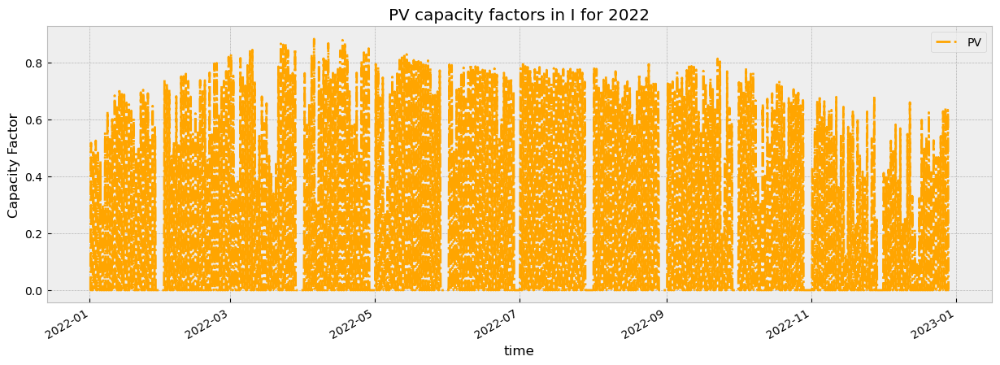

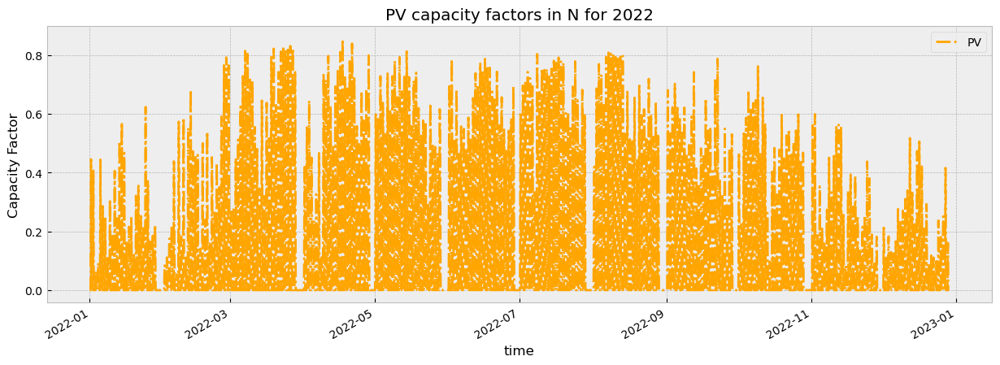

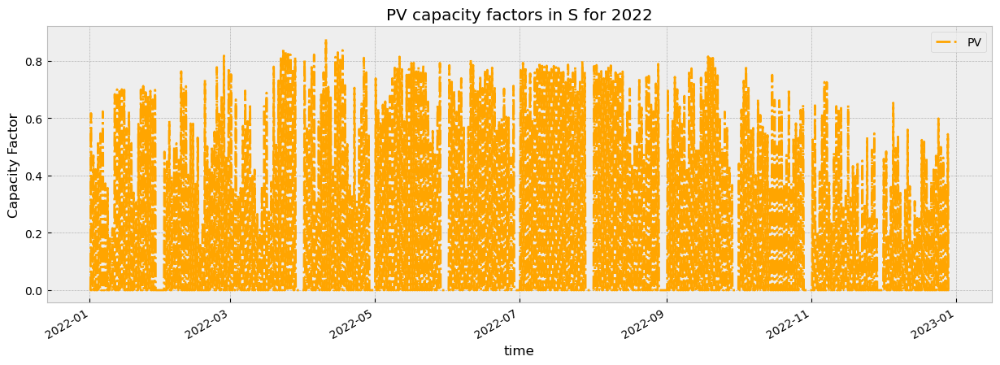

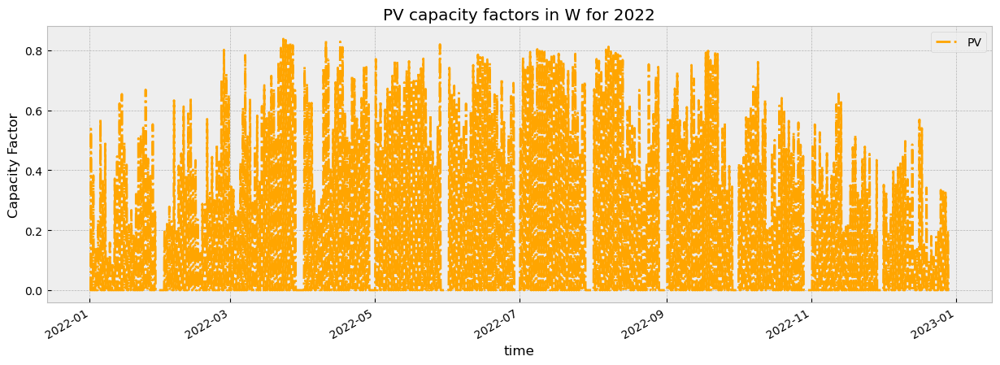

In [89]:
for region in region_names:
    us = pd.Series(pv[region], index=pv.index)

    fig, ax = plt.subplots(figsize=(15,5))
    plt.title(f'PV capacity factors in {region} for 2022')
    us.plot(color="orange", linestyle='-.', label='PV')
    plt.ylabel('Capacity Factor')
    plt.legend(loc="upper right")

#### Saving profile data to csv files

In [100]:
pv.to_csv('pv_profile.csv')
onwind.to_csv('onwind_profile.csv')
offshore.to_csv('offwind_profile.csv')

#### Building curent network data. Data frames creation for the profiles

In [79]:
points = points.to_crs(3035)
distances = pd.concat({k: points.distance(p) for k, p in points.items()}, axis=1).div(1e3)

dict = {1: 'N',
        2: 'C',
        3: 'W',
        4: 'S',
        5: 'I',}
distances.rename(columns=dict, index=dict, inplace=True)

distances

,C,I,N,S,W
Region_Abb,,,,,
C,0.000000,649.009416,314.815574,310.530074,244.208662
I,649.009416,0.000000,936.600016,478.915068,790.302902
N,314.815574,936.600016,0.000000,619.856814,405.711486
S,310.530074,478.915068,619.856814,0.000000,332.823265
W,244.208662,790.302902,405.711486,332.823265,0.000000
